In [1]:

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

nx=9
ny=6
# prepare object points
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.


images = glob.glob('camera_cal/calibration*.jpg')

chess_board_corner_imgs=[]
#Lets try to find the objpoint,img points etc
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        chess_board_corner_imgs.append(img)

print(len(chess_board_corner_imgs))

17


ValueError: num must be 1 <= num <= 16, not 17

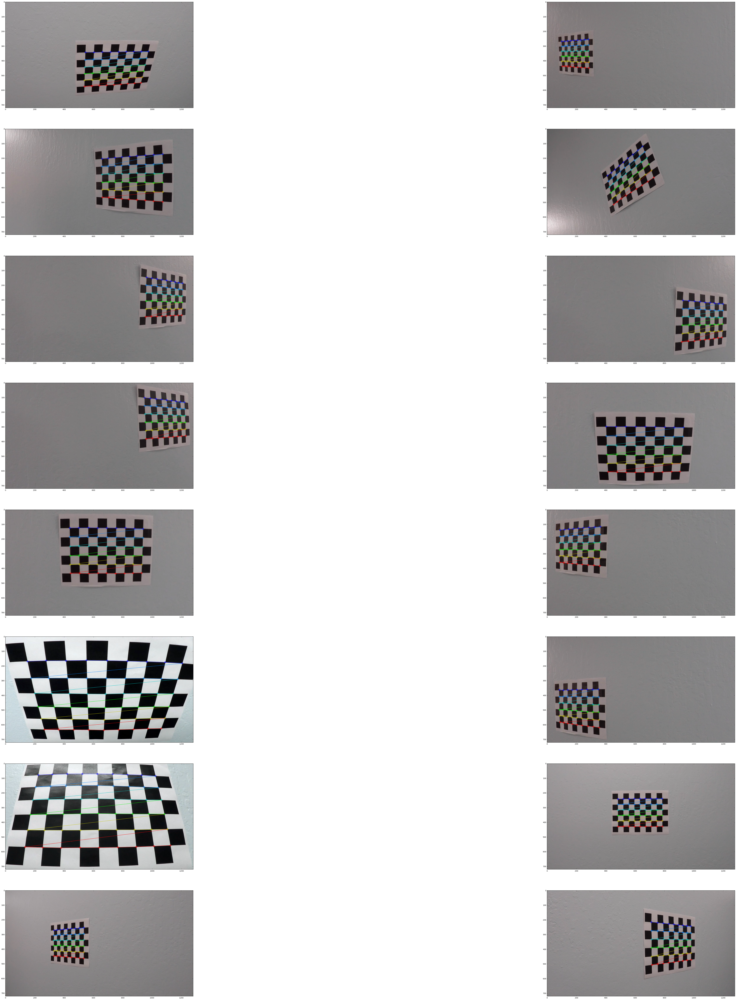

In [2]:
#Display the corner images
#Corners detected in 2 images only. Why?
fig = plt.figure(figsize=(100,100))
i=0
for img in chess_board_corner_imgs: 
    plt.subplot(len(chess_board_corner_imgs)/2,2,i+1)
    plt.imshow(img)
    i+=1

(1280, 720)


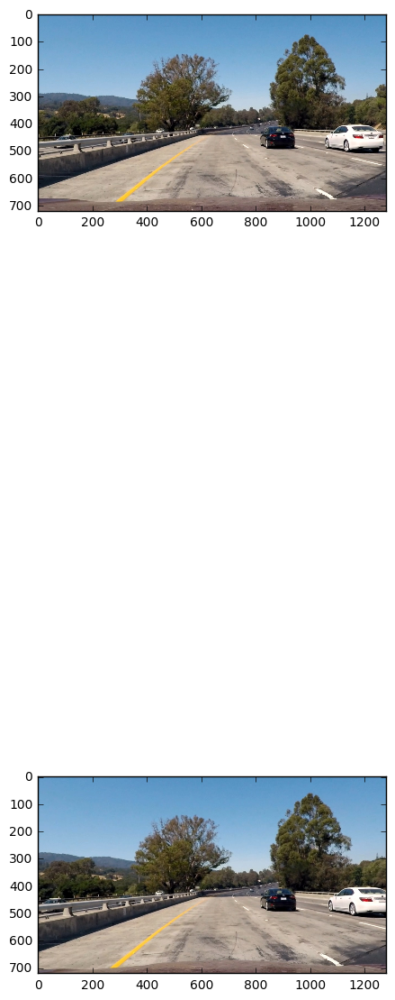

In [12]:
#Get camera distortion coefs and undistort an image

img = cv2.imread("test_images/test1.jpg")
img_size = (img.shape[1], img.shape[0])
print(img_size)
len(objpoints)
#Calibrate camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

#Undistort a image
dst = cv2.undistort(img, mtx, dist, None, mtx)

fig = plt.figure(figsize=(5,20))
plt.subplot(2,1,1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.subplot(2,1,2)
plt.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))





In [6]:
import pickle
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/cam_coefs_pickle.p", "wb" ) )